# Assignment 4: Induction and Recursion

*If something in the assignment is unclear or does not make sense, make a note and ask the lecturer, a TA in the exercise session, or a friend!*

### Homework Exercises

Solutions to the following exercises are to be handed in, either typed or handwritten. Write neatly and concisely, so the solutions are easy to read. You are allowed (even encouraged) to work in groups, but solutions have to be written and handed in individually. If you worked in groups, please state on your answer sheet who you worked with. 


1. (EG 4.46) Prove by induction that for all $m \in \mathbb{N}$,
    $$ \sum_{k = 1}^m (-k)^3 = \frac{-m^2 (m+1)^2}{4} .$$

2. (MIT 5.14) Prove by induction that for all $n \in \mathbb{N}$, $$ \sum_{k=1}^n k \cdot k! = (n + 1)! - 1 $$ 
    

3. (L 5.6, 5.7)

    * (This one is a bit tricky!) Let us denote by $\{0, 1\}^*$ the set of all finite binary strings, that is, $\{ 0,1 \}^* = \{\epsilon, 0, 1, 00, 01, 10, 11, 000, 001, 010, 011, \dots\}$, where $\epsilon$ denotes the empty string. Complete the recursive definition of the following function $f : \{0, 1\}^* \to \mathbb{N}$ such that $f$ is an injection,
        
        \begin{equation*}
            f(s) = \begin{cases}
                \underbar{\phantom{hello}}_{} &\text{ if } s = \epsilon \\
                \underbar{\phantom{hello}}_{} &\text{ if } s = 0s' \text{ for some } s' \in \{0,1\}^*\text{, meaning that }s\text{ starts with a }0 \\
                \underbar{\phantom{hello}}_{} &\text{ if } s = 1s' \text{ for some } s' \in \{0,1\}^*\text{, meaning that }s\text{ starts with a }1 \\
            \end{cases}.
        \end{equation*}

        Then prove that the recursive definition above does indeed define an injective function.

    * Complete the recursive definition of the following function $g : \mathbb{N} \to \{0, 1\}^*$ so that $g$ is injective,
    
        \begin{equation*}
            g(n) = \begin{cases}
                \underbar{\phantom{hello}}_{} &\text{ if } n = 0 \\
                \underbar{\phantom{hello}}_{} &\text{ if } n > 0 \\
            \end{cases}.
        \end{equation*}

        Prove that $g$ as defined above is indeed injective.

    * Can you conclude that there is a bijection between $\{0, 1\}^*$ and $\mathbb{N}$? (Hint: Is there a theorem from a previous assignment that can help?)

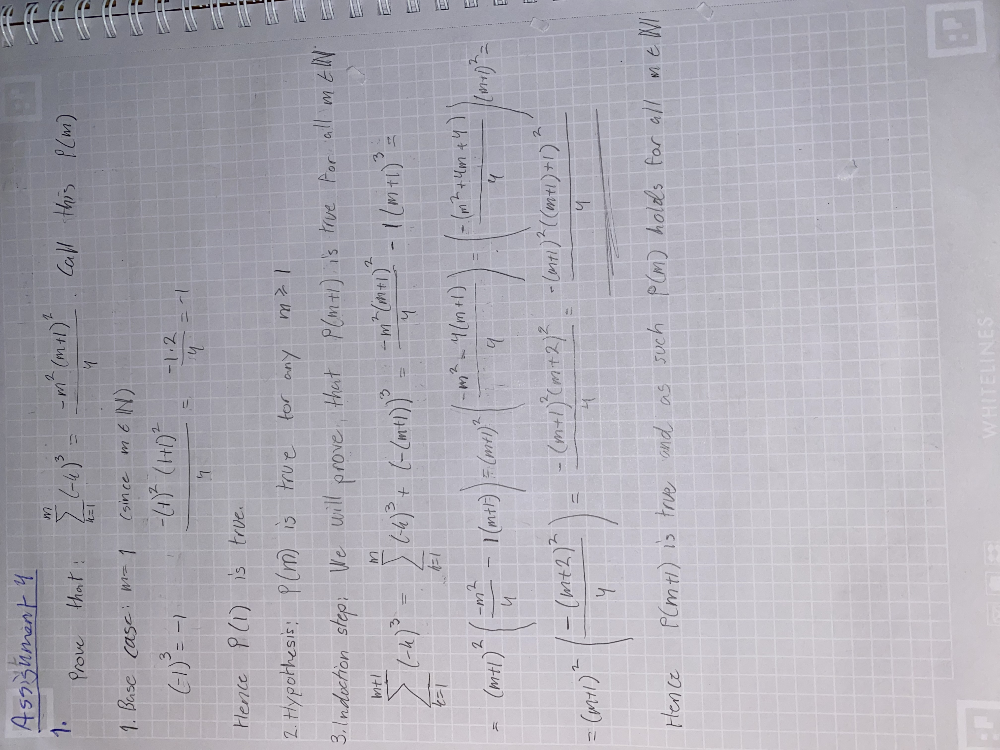

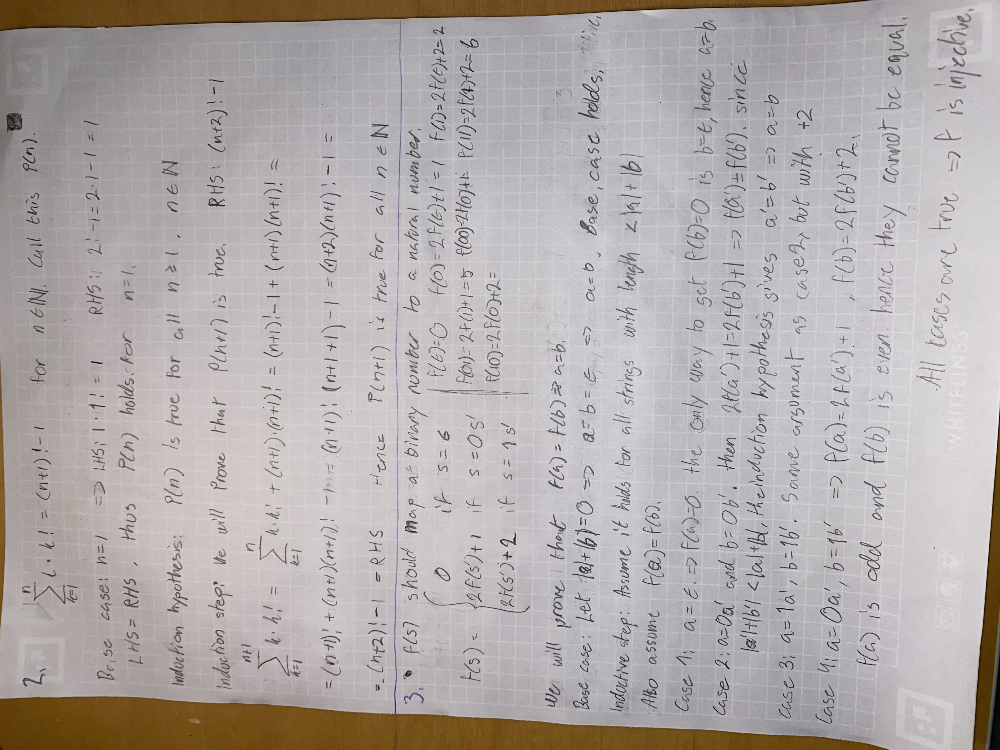

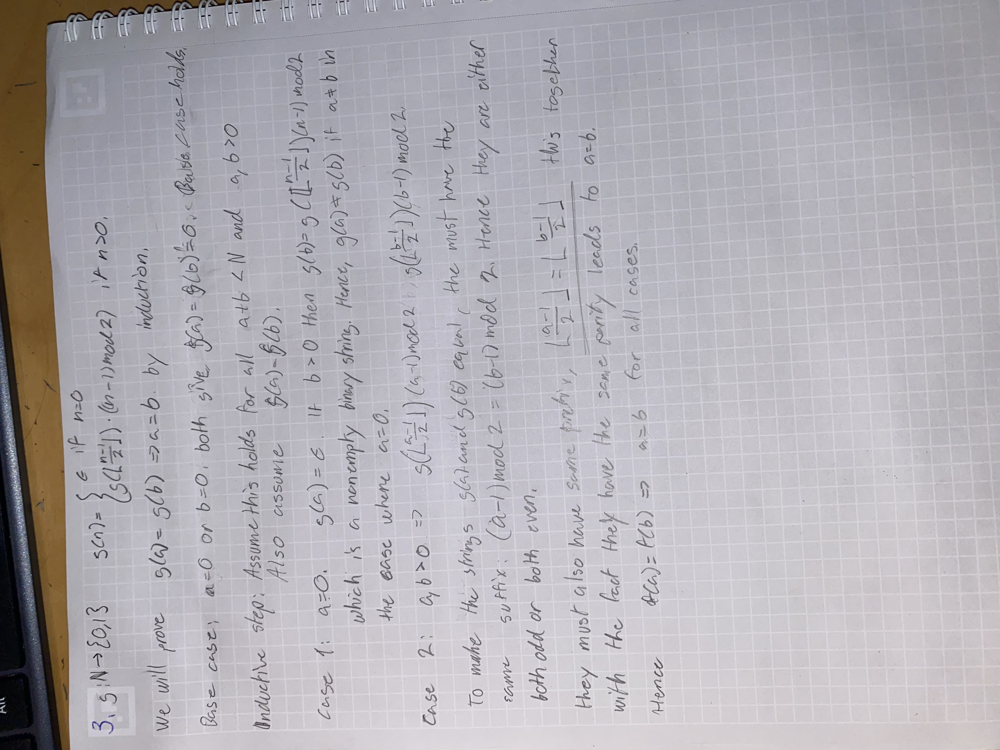

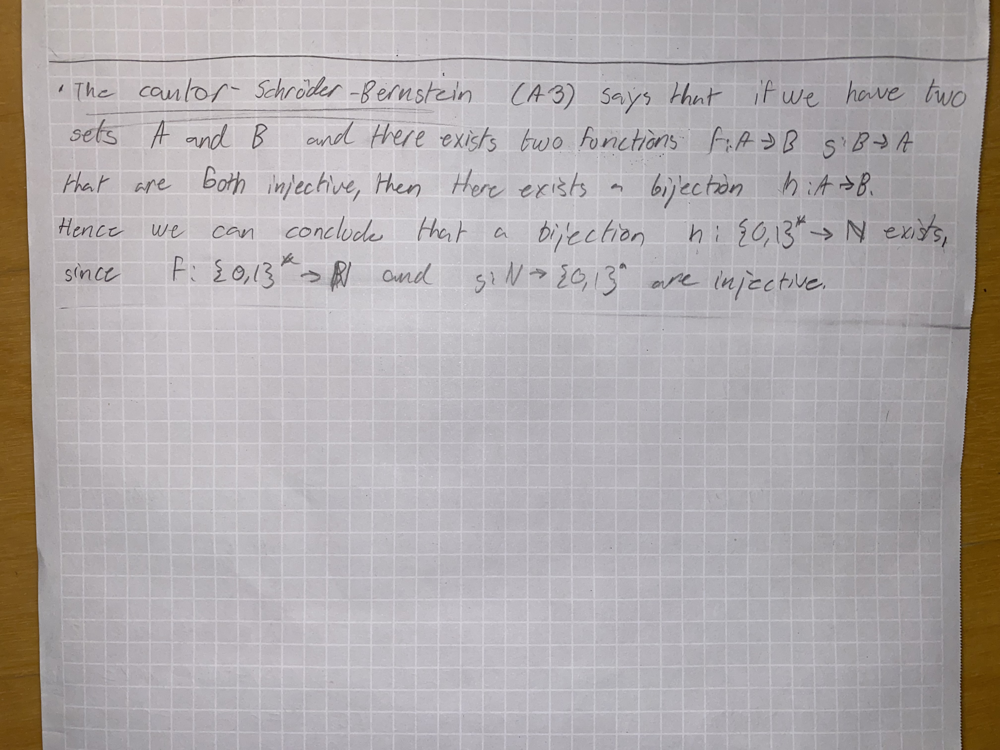

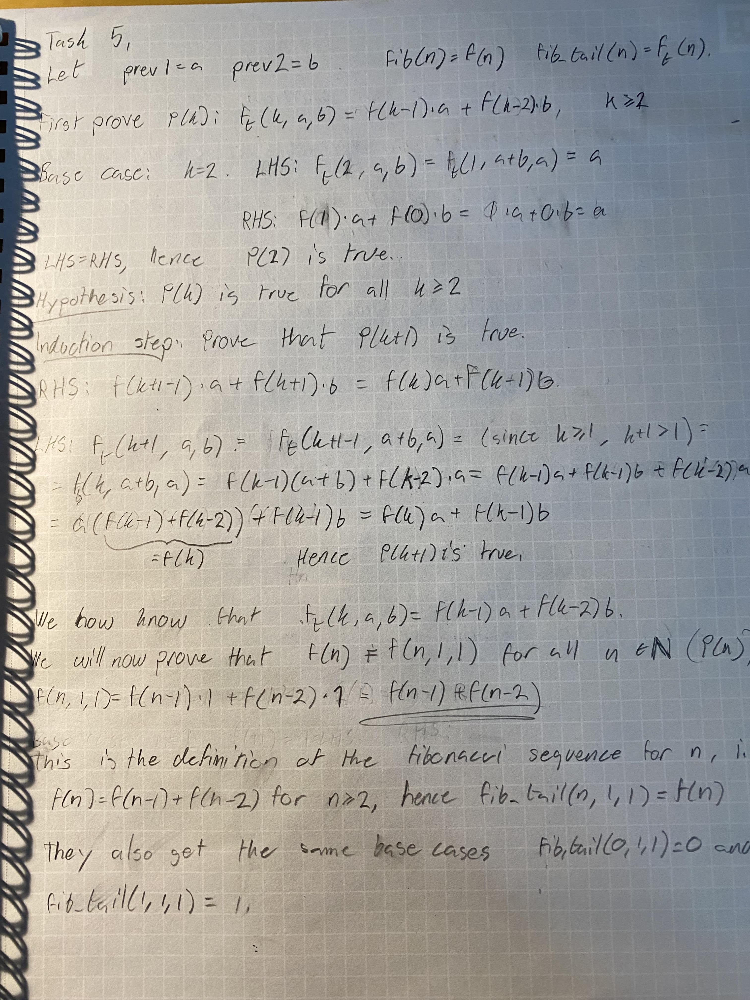

In [5]:
from IPython.display import Image, display

display(Image(filename='IMG_6328.jpeg'))
display(Image(filename='IMG_6330.jpeg'))
display(Image(filename='IMG_6331.jpeg'))
display(Image(filename='IMG_6332.jpeg'))
display(Image(filename='unnamed.jpg'))

### Programming Exercise

In this exercise we will explore the world-famous Fibonacci sequence that appears so often in nature and is the recursive function by excellence. The $n$-th Fibonacci number, $F(n)$, is defined as

\begin{equation*}
F(n) = 
\begin{cases}
 0 &\text{ if } n = 0 \\
 1 &\text{ if } n = 1 \\
 F(n-1) + F(n-2) &\text{ if } n > 2
\end{cases}
\end{equation*}


**Task 1** : Write a simple *recursive* program in Python called $\mathsf{fib(n)}$ that, given $n\in\mathbb{N}$, computes $F(n)$.


In [6]:
def fib(n):
    if n == 0 or n == 1:
        return n

    return fib(n - 1) + fib(n - 2)

real_fib_13 = [0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144]
home_fib_13 = [fib(n) for n in range(13)]

print(home_fib_13)
print(home_fib_13 == real_fib_13)

[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144]
True


The Fibonacci numbers were first described in Indian mathematics as early as 200 BC in work by Pingala on enumerating possible patterns of Sanskrit poetry formed from syllables of two lengths, although they are named after the Italian mathematician Leonardo of Pisa, also known as Fibonacci, who introduced the sequence to Western European mathematics in his 1202 book *Liber Abaci*.

Both Fibonacci and ancient Indian mathematicians had to calculate the Fibonacci numbers by tedious computations by hand. Luckily for us, we just wrote a simple computer program that can output the $n$-th Fibonacci number in milliseconds. Or can it really? 

**Task 2**: Run your code again and time how much time it takes to output each number. What is the largest $n$ for which your function outputs an answer in under 10 seconds?

Note 1: The execution of your program will take a bit of time, be patient!

Note 2: For information about the time.time() function, [see the documentation](https://docs.python.org/3/library/time.html).


In [7]:
import time

n = 0
start_time = time.time()
# to compute the time, use start_time = time.time() and later end_time = time.time() - start_time

fib(40)

print(time.time() - start_time)


16.54519295692444


What number did you get? Was it something like $40$? A bit lower?

While 10 seconds might look like very little computation time, think that a modern laptop like a MacBook with an M1 chip performs up to 3200000000 arithmetic operations per second, meaning that in 10 seconds it can perform up to $3.2 \cdot 10^7$ operations! This is a huge number: it's roughly the number of seconds in ten years... So, if instead of the computer, you executed the previous Python program by hand and were able to keep up the pace of one operation per second, it would take you roughly **ten years** to compute $F(40)$.

But wait a second... it feels like when computing $F(n)$ with pen and paper one should roughly take about $n$ additions, since at each recursive step we only need to compute one addition, and we already have the values of $F(n-1)$ and $F(n-2)$, since we computed them already... and computing 40 additions does not take 10 years.

**Task 3**: Can you explain this paradox?

The computer does not automatically cache the values F(n-1) and F(n-2) so it needs to recompute each value for each iteration. This leads to O(2^n) time complexity

We will now implement a much faster version of Fibonacci using something called *tail recursion*. For the purpose of this course, you do not need to come up with this more sophisticated solution, but we hope you can understand why it works.

**Task 4**: Look at the following piece of code and convince yourself that the function $\mathsf{fib\_tail}$ indeed does compute the same function as the previous implementation. You can run the script to see some examples of its speed. You do not need to modify this code or write any additional lines.

In [8]:
def fib_tail(n, prev1=1, prev2=1):
    if n == 0:
        return 0
    elif n == 1:
        return prev2
    else:
        return fib_tail(n - 1, prev1 + prev2, prev1)


# Observe that the new implementation has three parameters: n, prev1 and prev2; but the latter to have dafault values plugged in, so we can call fib_tail(n) without specifying those.

# Let's check the first 13 values!
home_fib_tail_13 = [fib_tail(n) for n in range(13)]
print(real_fib_13)
print(home_fib_tail_13)
print(real_fib_13 == home_fib_tail_13)

# We can now compute F(42) really fast!
print(fib_tail(42))

# Let's measure how much time it takes to compute F(42)
t0 = time.time()
f0 = fib(42)
t0 = time.time() - t0

t1 = time.time()
f1 = fib_tail(42)
t1 = time.time() - t1

print(
    f"The outputs are the same: {f0} and {f1}; the old implementation took {t0} s, while the new one took {t1} s."
)
print(
    "Note that e-05 in the second number!! (Or, if you have a very fast laptop, this might be even 0.0!)"
)


[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144]
[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144]
True
267914296
The outputs are the same: 267914296 and 267914296; the old implementation took 44.68181657791138 s, while the new one took 3.790855407714844e-05 s.
Note that e-05 in the second number!! (Or, if you have a very fast laptop, this might be even 0.0!)


**Task 5**: We have now implemented two computer programs that appear to compute the same function, except one seems much much faster that the other one. Let's be completely sure: we want mathematical proof! Prove by induction on $n$ that for all $n \in \mathbb{N}$,
$$\mathsf{fib}(n) = \mathsf{fib\_tail(n, 1, 1)}.$$

*Hint 1*: Prove first by induction the following lemma: for all $k \geq 1$, $\mathsf{fib\_tail}(k, \text{prev1}, \text{prev2}) = \mathsf{fib}(k-1) \cdot \text{prev1} + \mathsf{fib}(k-2) \cdot \text{prev2}$.

*Hint 2*: Once you have proven the lemma, think about the values that $\text{prev1}$ and $\text{prev2}$ take and plug them in.